<a href="https://colab.research.google.com/github/Denys88/rl_games/blob/master/notebooks/mujoco_envpool_training.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!apt-get install -y \
    libgl1-mesa-dev \
    libgl1-mesa-glx \
    libglew-dev \
    libosmesa6-dev \
    software-properties-common

!apt-get install -y patchelf


!pip install git+https://github.com/Denys88/rl_games
!pip install envpool
!pip install gym

!pip install free-mujoco-py
!apt-get install -y xvfb python-opengl ffmpeg > /dev/null 2>&1
!pip install imageio==2.4.1
!pip install -U colabgymrender

In [4]:
!export LD_LIBRARY_PATH="$LD_LIBRARY_PATH:/home/footoredo/.mujoco/mujoco210/bin"
!printenv

LANGUAGE=en_CA:en
USER=footoredo
SSH_CLIENT=142.198.90.98 39446 2233
XDG_SESSION_TYPE=tty
SHLVL=2
MOTD_SHOWN=pam
HOME=/home/footoredo
OLDPWD=/home/footoredo/playground/rl_games/notebooks
DBUS_SESSION_BUS_ADDRESS=unix:path=/run/user/1001/bus
LOGNAME=footoredo
_=/usr/bin/printenv
XDG_SESSION_CLASS=user
XDG_SESSION_ID=1175
PATH=/home/footoredo/miniconda3/envs/rl_games/bin:/home/footoredo/.vscode-server/bin/252e5463d60e63238250799aef7375787f68b4ee/bin/remote-cli:/usr/local/cuda-11.7/bin:/home/footoredo/bin:/home/footoredo/miniconda3/envs/rl_games/bin:/home/footoredo/miniconda3/condabin:/usr/local/sbin:/usr/local/bin:/usr/sbin:/usr/bin:/sbin:/bin:/usr/games:/usr/local/games:/snap/bin
VSCODE_AGENT_FOLDER=/home/footoredo/.vscode-server
XDG_RUNTIME_DIR=/run/user/1001
LANG=en_CA.UTF-8
SHELL=/usr/bin/zsh
PWD=/home/footoredo/playground/rl_games/notebooks
SSH_CONNECTION=142.198.90.98 39446 142.1.44.142 2233
VSCODE_HANDLES_SIGPIPE=true
ZSH=/home/footoredo/.oh-my-zsh
PAGER=cat
LESS=-R
LSCOLORS=Gxfxc

In [1]:
import os
print(os.environ["LD_LIBRARY_PATH"])
# os.environ["LD_LIBRARY_PATH"] = f"/home/footoredo/.mujoco/mujoco210/bin:/usr/lib/nvidia/:os.environ['LD_LIBRARY_PATH']"
import mujoco_py

:/home/footoredo/.mujoco/mujoco210/bin:/home/footoredo/.mujoco/mujoco200/bin:/home/footoredo/.mujoco/mjpro150/bin:/usr/lib/nvidia


In [ ]:
!pip show rl-games

In [ ]:
!nvidia-smi -L

In [8]:
%load_ext tensorboard

In [9]:
%tensorboard --logdir 'runs/'

ERROR: Failed to launch TensorBoard (exited with 1).
Contents of stderr:
TensorFlow installation not found - running with reduced feature set.
/home/footoredo/.local/lib/python3.8/site-packages/tensorboard_data_server/bin/server: /lib/x86_64-linux-gnu/libc.so.6: version `GLIBC_2.33' not found (required by /home/footoredo/.local/lib/python3.8/site-packages/tensorboard_data_server/bin/server)
/home/footoredo/.local/lib/python3.8/site-packages/tensorboard_data_server/bin/server: /lib/x86_64-linux-gnu/libc.so.6: version `GLIBC_2.34' not found (required by /home/footoredo/.local/lib/python3.8/site-packages/tensorboard_data_server/bin/server)
/home/footoredo/.local/lib/python3.8/site-packages/tensorboard_data_server/bin/server: /lib/x86_64-linux-gnu/libc.so.6: version `GLIBC_2.32' not found (required by /home/footoredo/.local/lib/python3.8/site-packages/tensorboard_data_server/bin/server)
I0511 22:33:26.347303 140381964986112 plugin.py:429] Monitor runs begin
Address already in use
Port 6006

In [1]:
## walker_envpool config:
walker_config = {'params': {'algo': {'name': 'a2c_continuous'},
  'config': {'bound_loss_type': 'regularisation',
   'bounds_loss_coef': 0.0005,
   'clip_value': True,
   'critic_coef': 4,
   'e_clip': 0.2,
   'entropy_coef': 0.0,
   'env_config': {'env_name': 'HalfCheetah-v4', 'seed': 5, 'exclude_current_positions_from_observation': False},
   'env_name': 'envpool',
   'gamma': 0.99,
   'grad_norm': 1.0,
   'horizon_length': 64,
   'kl_threshold': 0.008,
   'learning_rate': '3e-4',
   'lr_schedule': 'adaptive',
   'max_epochs': 5000,
   'mini_epochs': 5,
   'minibatch_size': 2048,
   'name': 'HalfCheetah-v4',
   'normalize_advantage': True,
   'normalize_input': True,
   'normalize_value': True,
   'num_actors': 64,
   'player': {'render': True},
   'ppo': True,
   'reward_shaper': {'scale_value': 5},
   'schedule_type': 'standard',
   'score_to_win': 20000,
   'tau': 0.95,
   'truncate_grads': True,
   'use_smooth_clamp': True,
   'value_bootstrap': True,
   'use_sea': True,
   "sea_config":{
      "objective_dim":64,
      "achievement_buffer_config":{
         "length":8,
         "capacity":512,
         "minimum_length":2
      },
      "mini_epochs":4,
      "minibatch_size": 512,
      "truncate_grads": False,
      "normalize_input": False,
      "learning_rate": 3e-4,
      'network': {'mlp': {'activation': 'elu',
         'initializer': {'name': 'default'},
         'units': [256, 256]},
         'name': 'actor_critic',
         'separate': False,
         'space': {'continuous': {'fixed_sigma': True,
         'mu_activation': 'None',
         'mu_init': {'name': 'default'},
         'sigma_activation': 'None',
         'sigma_init': {'name': 'const_initializer', 'val': 0}}}}
   }
   },
  'model': {'name': 'continuous_a2c_logstd'},
  'network': {'mlp': {'activation': 'elu',
    'initializer': {'name': 'default'},
    'units': [256, 128, 64]},
   'name': 'actor_critic',
   'separate': False,
   'space': {'continuous': {'fixed_sigma': True,
     'mu_activation': 'None',
     'mu_init': {'name': 'default'},
     'sigma_activation': 'None',
     'sigma_init': {'name': 'const_initializer', 'val': 0}}}},
  'seed': 5}}

In [2]:
## config from the openai gym mujoco (should have the same network and normalization) to render result:

player_walker_config = {'params': {'algo': {'name': 'a2c_continuous'},
  'config': {'bounds_loss_coef': 0.0,
   'clip_value': False,
   'critic_coef': 1,
   'e_clip': 0.2,
   'entropy_coef': 0.0,
   'env_config': {'name': 'HalfCheetah-v3', 'seed': 5, 'exclude_current_positions_from_observation': False},
   'env_name': 'openai_gym',
   'gamma': 0.995,
   'grad_norm': 0.5,
   'horizon_length': 128,
   'kl_threshold': 0.008,
   'learning_rate': '3e-4',
   'lr_schedule': 'adaptive',
   'max_epochs': 5000,
   'mini_epochs': 4,
   'minibatch_size': 512,
   'name': 'Walker2d-v3',
   'normalize_advantage': True,
   'normalize_input': True,
   'normalize_value': True,
   'num_actors': 16,
   'player': {'render': True},
   'ppo': True,
   'reward_shaper': {'scale_value': 5},
   'schedule_type': 'standard',
   'score_to_win': 10000,
   'tau': 0.95,
   'truncate_grads': True,
   'value_bootstrap': True,
   'use_sea': True,
   "sea_config":{
      "objective_dim":64,
      "achievement_buffer_config":{
         "length":8,
         "capacity":512,
         "minimum_length":2
      },
      "mini_epochs":4,
      "minibatch_size":64,
      "truncate_grads": False,
      "normalize_input": False,
      "learning_rate": 3e-4,
      'network': {'mlp': {'activation': 'elu',
         'initializer': {'name': 'default'},
         'units': [256, 256]},
         'name': 'actor_critic',
         'separate': False,
         'space': {'continuous': {'fixed_sigma': True,
         'mu_activation': 'None',
         'mu_init': {'name': 'default'},
         'sigma_activation': 'None',
         'sigma_init': {'name': 'const_initializer', 'val': 0}}}}
   }
   },
  'model': {'name': 'continuous_a2c_logstd'},
  'network': {'mlp': {'activation': 'elu',
    'initializer': {'name': 'default'},
    'units': [256, 128, 64]},
   'name': 'actor_critic',
   'separate': False,
   'space': {'continuous': {'fixed_sigma': True,
     'mu_activation': 'None',
     'mu_init': {'name': 'default'},
     'sigma_activation': 'None',
     'sigma_init': {'name': 'const_initializer', 'val': 0}}}},
  'seed': 5}}

In [3]:
import yaml
from rl_games.torch_runner import Runner
runner = Runner()
expr_name = 'HalfCheetah_mujoco_sea_mul_4_new3'

/home/footoredo/miniconda3/envs/rl_games/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/footoredo/miniconda3/envs/rl_games/lib/python3.8/site-packages/torch/utils/tensorboard/__init__.py:4: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if not hasattr(tensorboard, "__version__") or LooseVersion(


In [4]:
config = walker_config
config['params']['config']['full_experiment_name'] = expr_name
config['params']['config']['max_epochs'] = 200
config['params']['config']['save_best_after'] = 100
config['params']['config']['horizon_length'] = 512
config['params']['config']['num_actors'] = 8
config['params']['config']['minibatch_size'] = 1024

runner.load(config)
runner.run({
    'train': True,
})

self.seed = 5
Started to train
Exact experiment name requested from command line: HalfCheetah_mujoco_sea_mul_4_new3
Adding SEA net
[[ 0.44122749 -0.33087015  2.43077119 -0.25209213  0.10960984]
 [ 0.56813272  0.01275832  1.18906073 -0.07359332 -2.85968797]
 [-1.69367504  0.30364847 -0.40899234 -0.75483059 -0.40751917]
 [ 0.83594396  0.28740365 -0.9955963   0.90688947  0.02421074]
 [-0.16636061  1.35311311 -0.92862651 -0.03547249  0.85964595]]
[1.0, 1.5, 2.25, 3.375, 5.0625, 7.59375, 11.390625, 17.0859375, 25.62890625, 38.443359375, 57.6650390625, 86.49755859375, 129.746337890625, 194.6195068359375, 291.92926025390625, 437.8938903808594, 656.8408355712891, 985.2612533569336, 1477.8918800354004, 2216.8378200531006, 3325.256730079651, 4987.885095119476, 7481.8276426792145, 11222.741464018822, 16834.112196028233, 25251.16829404235, 37876.75244106352, 56815.128661595285, 85222.69299239293, 127834.03948858939, 191751.0592328841, 287626.58884932613, 431439.8832739892, 647159.8249109838, 97073

In [5]:

config = player_walker_config
config['params']['config']['player']['render'] = False
config['params']['config']['player']['games_num'] = 10

name = walker_config['params']['config']['name']

runner.load(config)
agent = runner.create_player()
agent.restore(f'runs/{expr_name}/nn/last_HalfCheetah-v4_ep_200_rew__0.89762527_.pth')

self.seed = 5
Adding SEA net
[BasePlayer] Creating regular env:  openai_gym


/home/footoredo/miniconda3/envs/rl_games/lib/python3.8/site-packages/gym/envs/registration.py:593: UserWarning: WARN: The environment HalfCheetah-v3 is out of date. You should consider upgrading to version `v4`.
  logger.warn(


[[ 0.44122749 -0.33087015  2.43077119 -0.25209213  0.10960984]
 [ 0.56813272  0.01275832  1.18906073 -0.07359332 -2.85968797]
 [-1.69367504  0.30364847 -0.40899234 -0.75483059 -0.40751917]
 [ 0.83594396  0.28740365 -0.9955963   0.90688947  0.02421074]
 [-0.16636061  1.35311311 -0.92862651 -0.03547249  0.85964595]]
{'observation_space': Dict(objective: Box(-inf, inf, (64,), float64), observation: Box(-inf, inf, (18,), float64)), 'action_space': Box(-1.0, 1.0, (6,), float32), 'agents': 1, 'value_size': 1}
self.use_objective True
82
build mlp: 82
RunningMeanStd:  (1,)
RunningMeanStd:  (64,)
RunningMeanStd:  (18,)
self.use_objective False
18
build mlp: 18
build mlp: 70
RunningMeanStd:  (1,)
=> loading checkpoint 'runs/HalfCheetah_mujoco_sea_mul_4_new3/nn/last_HalfCheetah-v4_ep_200_rew__0.89762527_.pth'
dict_keys(['model', 'epoch', 'optimizer', 'sea_net', 'frame', 'last_mean_rewards', 'env_state'])


/home/footoredo/miniconda3/envs/rl_games/lib/python3.8/site-packages/gym/envs/mujoco/mujoco_env.py:237: UserWarning: WARN: This version of the mujoco environments depends on the mujoco-py bindings, which are no longer maintained and may stop working. Please upgrade to the v4 versions of the environments (which depend on the mujoco python bindings instead), unless you are trying to precisely replicate previous works).
  logger.warn(
/home/footoredo/miniconda3/envs/rl_games/lib/python3.8/site-packages/gym/core.py:329: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/home/footoredo/miniconda3/envs/rl_games/lib/python3.8/site-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_s

In [11]:

from colabgymrender.recorder import Recorder
directory = './video'
agent.env = Recorder(agent.env, directory)

In [6]:

agent.run()
# print(agent.sea_embeds)

/home/footoredo/miniconda3/envs/rl_games/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:241: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


reward: 9.0 steps: 1000.0000
reward: 10.0 steps: 1000.0000
reward: 10.0 steps: 1000.0000
reward: 10.0 steps: 1000.0000
reward: 10.0 steps: 1000.0000
reward: 10.0 steps: 1000.0000
reward: 10.0 steps: 1000.0000
reward: 10.0 steps: 1000.0000
reward: 10.0 steps: 1000.0000
reward: 10.0 steps: 1000.0000
av reward: 9.9 av steps: 1000.0


In [15]:
print(agent.sea_preds)

[[array([-0.11519147], dtype=float32), array([-0.1302295], dtype=float32), array([-0.11121166], dtype=float32), array([-0.15005533], dtype=float32), array([-0.00475181], dtype=float32), array([-0.1836842], dtype=float32), array([-0.16107813], dtype=float32), array([-0.03619923], dtype=float32)], [array([-0.00571221], dtype=float32), array([-0.3554333], dtype=float32), array([-0.19621746], dtype=float32), array([-0.18177506], dtype=float32), array([-0.11806746], dtype=float32), array([0.11945359], dtype=float32), array([-0.12943545], dtype=float32), array([-0.06129642], dtype=float32)], [array([-0.04064555], dtype=float32), array([0.01764875], dtype=float32), array([-0.04058889], dtype=float32), array([-0.09697185], dtype=float32), array([-0.1810809], dtype=float32), array([0.10299114], dtype=float32), array([-0.06290791], dtype=float32), array([0.03277622], dtype=float32)], [array([-0.00734792], dtype=float32), array([-0.12863487], dtype=float32), array([-0.0805569], dtype=float32), ar

In [7]:
import numpy as np

embeds = agent.sea_embeds
n = len(embeds)
max_len = max([len(e) for e in embeds])

for i in range(n):
    l = len(embeds[i])
    if l > 1:
        pairwise_distances = []
        for j in range(l):
            for k in range(j + 1, l):
                dis = np.square(embeds[i][j] - embeds[i][k]).sum()
                pairwise_distances.append(dis)
        print(np.mean(pairwise_distances), np.min(pairwise_distances))

for j in range(max_len):
    _embeds = []
    for i in range(n):
        if len(embeds[i]) > j:
            _embeds.append(embeds[i][j])
    print(j, len(_embeds))
    if len(_embeds) > 1:
        pairwise_distances = []
        l = len(_embeds)
        for x in range(l):
            for y in range(x + 1, l):
                dis = np.square(_embeds[x] - _embeds[y]).sum()
            pairwise_distances.append(dis)
        print(np.mean(pairwise_distances), np.min(pairwise_distances))

0.057971954 0.020696647
0.052104708 0.027162768
0.051954255 0.015697012
0.04121136 0.010691619
0.055484273 0.019465178
0.047550984 0.013606675
0.043158703 0.019563217
0.063096985 0.023159685
0.042192135 0.009859057
0.05665336 0.020386085
0 10
0.06461922 0.039630663
1 10
0.07231863 0.057766207
2 10
0.043662 0.03472895
3 10
0.03870389 0.02580458
4 10
0.03922129 0.017824288
5 10
0.039804954 0.024664365
6 10
0.050595026 0.03852509
7 10
0.04544527 0.017396605
8 10
0.040867437 0.007843958
9 9
0.060812917 0.045619298


(99, 64)


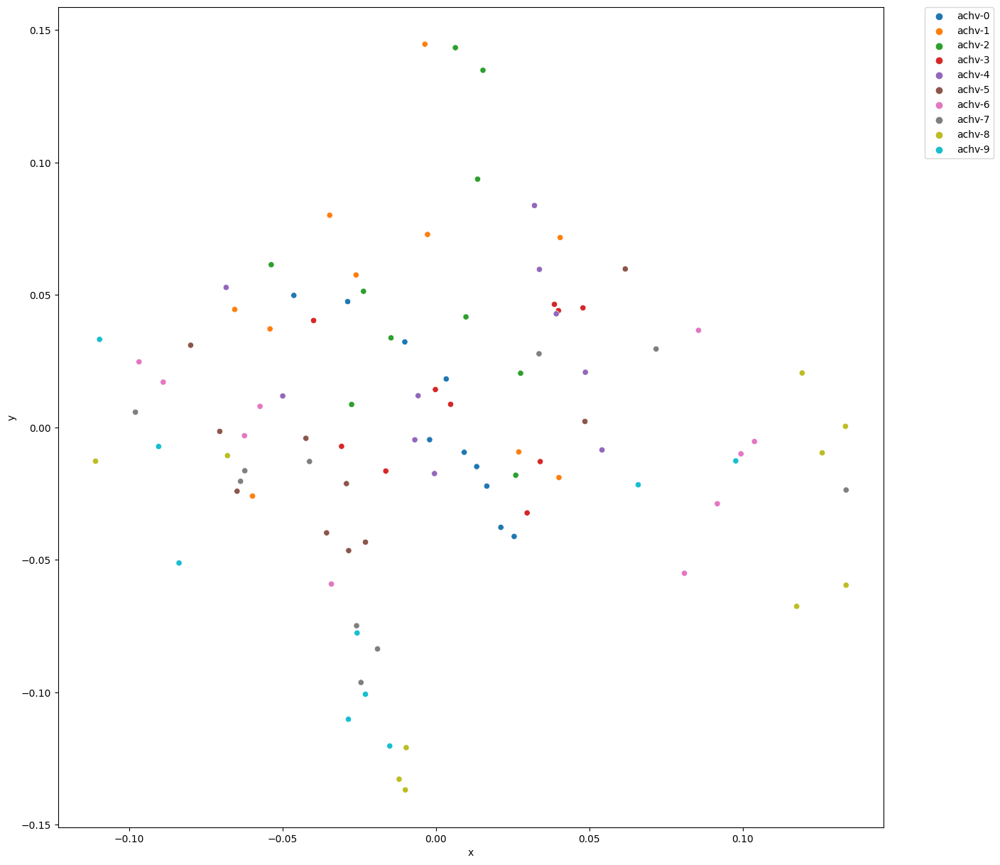

In [8]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from collections import defaultdict
from collections.abc import Iterable
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import re

flat_embeds = np.concatenate(embeds, 0)
flat_embeds = flat_embeds.reshape(flat_embeds.shape[0], -1)
print(flat_embeds.shape)
pca = PCA(n_components=2)
embeds_new = pca.fit_transform(flat_embeds)

data = {
    'c': [],
    'x': [],
    'y': []
}

idx = 0
for i in range(n):
    # for j, k in enumerate(key_frames[i]):
    c = 0
    for k in range(len(embeds[i])):
        # if not replay["action"][i][k].startswith("move_"):
        # if replay['action'][i][j] == 'do':
        data['c'].append(f'achv-{k}')
        data['x'].append(embeds_new[idx, 0])
        data['y'].append(embeds_new[idx, 1])
        idx += 1
        c += 1

df = pd.DataFrame(data)
plt.figure(figsize=(15, 15))
sns.scatterplot(data=df, x='x', y='y', hue='c')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)

In [13]:
agent.env.play()

Moviepy - Building video temp-{start}.mp4.
Moviepy - Writing video temp-{start}.mp4



Moviepy - Done !
Moviepy - video ready temp-{start}.mp4


In [1]:
import yaml
from rl_games.torch_runner import Runner
runner = Runner()

config = yaml.safe_load(open('../rl_games/configs/mujoco/ant_envpool.yaml'))
config['params']['config']['env_name'] = 'openai_gym'
config['params']['config']['env_config'] = {
    'name': 'Ant-v4',
    'render_mode': 'single_rgb_array',
    'seed': 5
}
config['params']['config']['player']['render'] = False
config['params']['config']['player']['games_num'] = 1

runner.load(config)
agent = runner.create_player()
agent.restore('../runs/Ant-v4_envpool_13-19-43-35/nn/Ant-v4_envpool.pth')

/home/footoredo/miniconda3/envs/rl_games/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/footoredo/miniconda3/envs/rl_games/lib/python3.8/site-packages/torch/utils/tensorboard/__init__.py:4: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if not hasattr(tensorboard, "__version__") or LooseVersion(


self.seed = 5
[BasePlayer] Creating regular env:  openai_gym


/home/footoredo/miniconda3/envs/rl_games/lib/python3.8/site-packages/gym/core.py:329: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/home/footoredo/miniconda3/envs/rl_games/lib/python3.8/site-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(


{'observation_space': Box(-inf, inf, (27,), float64), 'action_space': Box(-1.0, 1.0, (8,), float32), 'agents': 1, 'value_size': 1}
self.use_objective False
build mlp: 27
RunningMeanStd:  (1,)
RunningMeanStd:  (27,)
=> loading checkpoint '../runs/Ant-v4_envpool_13-19-43-35/nn/Ant-v4_envpool.pth'


In [2]:
from colabgymrender.recorder import Recorder
directory = './video'
agent.env = Recorder(agent.env, directory)

/home/footoredo/miniconda3/envs/rl_games/lib/python3.8/site-packages/colabgymrender/recorder.py:1: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import Video, display


FatalError: gladLoadGL error